<a href="https://colab.research.google.com/github/igor-stefan/filtros_digitais_PDS_EE2022/blob/main/ProjetoPDS_2022_1_FIltros_Digitais.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Importando as bibliotecas necessárias

In [ ]:
#!pip install pysoundfile
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import soundfile as sf
from scipy.signal import freqz
from IPython.display import Audio
from google.colab import files
pi = np. pi
eps = 1e-3

##Definindo as funções necessárias para a filtragem

In [ ]:
def parametros_kaiser(sigma, deltaW): # retorna os parametros M e Beta para serem utilizados na janela kaiser
  A = -20 * np.log10(sigma)
  beta = 0    #inicializando a variavel beta
  if A > 50:  #beta é alterada de acordo com a condicao
    beta = .1102 * (A - 8.7)
  elif A >= 21:
    .5842 * ((A - 21) ** .4) + .07886 * (A - 21)
  aux = (A - 8) / (2.285 * deltaW)  # auxiliar p calculo de M
  M = int(np.ceil(aux))             # M arredondado para o menor inteiro >= aux
  return M, beta


####################################### respostas ideais ###############################################


def pb_ideal(wc, M):               # retorna a resposta ideal ao impulso de um filtro PASSA BAIXA
  alfa = (M - 1) / 2               # deslocamento a ser realizado no sinal
  n = np.arange(0, M)              # vetor de numero de amostras crescentes de 0 a M - 1
  m = n - alfa + eps               # valor que gera as amostras deslocadas para a direita
  return np.sin(wc * m) / (pi * m) 

def pa_ideal(wc, M): # retorna a resposta ideal ao impulso de um filtro PASSA ALTA
  return pb_ideal(pi, M) - pb_ideal(wc, M)

def pf_ideal(wc1, wc2, M): # retorna a resposta ideal ao impulso de um filtro PASSA FAIXA
  return pb_ideal(wc2, M) - pb_ideal(wc1, M)

def rf_ideal(wc1, wc2, M): # retorna a resposta ideal ao impulso de um filtro REJEITA FAIXA
  return pb_ideal(pi, M) - pb_ideal(wc2, M) + pb_ideal(wc1, M)


################################## funcoes auxiliares e para plot de graficos ###############################


def get_fft(sinal): # retorna dois vetores de uma TF, para abscissas retorna a freq, para ordenada retorna a magnitude
  a = np.fft.fft(sinal, norm='forward')
  eixo_freq = np.fft.fftfreq(len(sinal), pam) 
  cut = int(np.ceil(len(a)/2))
  a = a[:cut]
  eixo_freq = eixo_freq[:cut]
  return eixo_freq, np.abs(a)

def getFreqResponse(h, w):
  nw, h = freqz(h, 1)                    # novo w e h ||| é passado o filtro h e especificada a ordem 1
  mag = np.abs(h)                        # magnitude
  db = 20 * np.log10(mag)                # magnitude em db
  pha = np.unwrap(np.angle(h))           # fase
  return mag, db, pha, nw

def plotFilterInfo(mag, db, pha, nw, w, fs, ke, kd, fe, fd): # grafico com informacoes relacionadas à filtragem realizada
  fig = plt.figure(figsize=(12, 10))
  spec = gridspec.GridSpec(ncols=2, nrows=5, figure=fig)
  f1 = fig.add_subplot(spec[0,:]) # mag
  f2 = fig.add_subplot(spec[1,:]) # mag em db
  f3 = fig.add_subplot(spec[2,0]) # resposta em fase
  f4 = fig.add_subplot(spec[2,1]) # janela
  f5 = fig.add_subplot(spec[3,0]) # fft canal esquerdo
  f6 = fig.add_subplot(spec[3,1]) # fft canal direito
  f7 = fig.add_subplot(spec[4,0]) # fft canal esquerdo filtrado
  f8 = fig.add_subplot(spec[4,1]) # fft canal direito filtrado

  f1.plot(to_freq(nw, fs), mag, 'b')
  f2.plot(to_freq(nw, fs), db, 'g')
  f3.plot(nw/pi, pha, 'k')
  f4.plot(w, 'r')
  f5.plot(ke[0], ke[1])
  f6.plot(kd[0], kd[1])
  f7.plot(fe[0], fe[1])
  f8.plot(fd[0], fd[1])

  f1.grid(1)
  f2.grid(1)
  f3.grid(1)
  f4.grid(1)
  f5.grid(1)
  f6.grid(1)
  f7.grid(1)
  f8.grid(1)

  f1.set_xlabel('frequência (Hz)')
  f1.set_ylabel('magnitude')
  f1.set_title('comportamento do filtro')

  f2.set_xlabel('frequência (Hz)')
  f2.set_ylabel('magnitude (dB)')
  f2.set_title('atenuação (dB)')

  f3.set_xlabel('frequência (x pi)')
  f3.set_ylabel('ângulo (rad)')
  f3.set_title('fase')

  f4.set_title('forma e comprimento da janela')

  f5.set_xlabel('frequência (Hz)')
  f5.set_ylabel('magnitude (energia)')
  f5.set_title('sinal canal esquerdo')

  f6.set_xlabel('frequência (Hz)')
  f6.set_ylabel('magnitude (energia)')
  f6.set_title('sinal canal direito')

  f7.set_xlabel('frequência (Hz)')
  f7.set_ylabel('magnitude (energia)')
  f7.set_title('sinal FILTRADO canal esquerdo')

  f8.set_xlabel('frequência (Hz)')
  f8.set_ylabel('magnitude (energia)')
  f8.set_title('sinal FILTRADO canal direito')

  fig.tight_layout()

def to_omega(f, fs):
  return (2 * pi * f) / fs

def to_freq(w, fs):
  return w * fs / (2 * pi)

##Adquirindo sinal de áudio, plot no tempo e na frequência

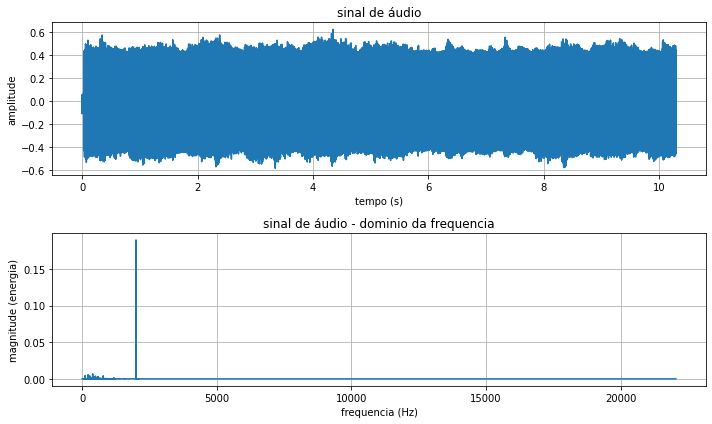

In [ ]:
#audio = files.upload()
dados, freqam = sf.read('piano-noise-2khz.wav', start=0)
pam = 1/freqam # periodo de amostragem

esq = []
dir = []

for k in range(len(dados)):
  esq.append(dados[k][0])
  dir.append(dados[k][1])

t = np.linspace(0, len(esq) * pam, len(esq)) # vetor com o tempo

fig, (ax1, ax2) = plt.subplots(2, figsize=(10,6))
ax1.plot(t, esq)
ax1.grid(1)
ax1.set_title("sinal de áudio")
ax1.set_xlabel("tempo (s)")
ax1.set_ylabel("amplitude")

f, m = get_fft(esq)
ax2.plot(f, m)
ax2.set_title("sinal de áudio - dominio da frequencia")
ax2.set_xlabel("frequencia (Hz)")
ax2.set_ylabel("magnitude (energia)")
ax2.grid(1)

fig.tight_layout()
plt.show()


##Escute o sinal de áudio

In [ ]:
print('escute o sinal de áudio')
Audio([esq, dir], rate=freqam) #sinal de audio unindo os dois canais

escute o sinal de áudio


##Utilizando Janela de Hanning e filtro Rejeita Faixa




*   O objetivo é rejeitar a faixa de frequência entre 1950 Hz e 2200 Hz






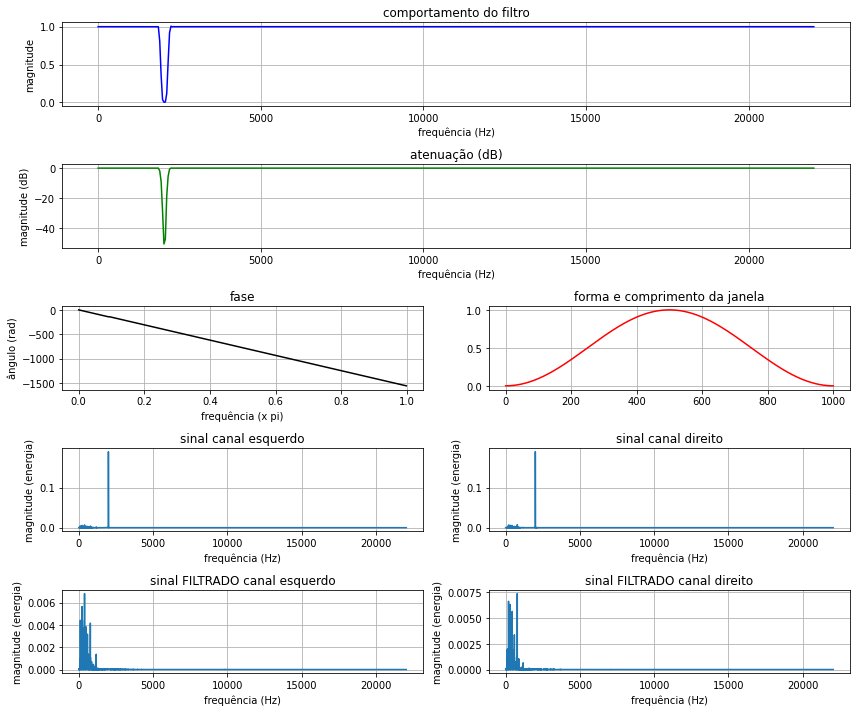

In [ ]:
# definindo parametros
wp1 = to_omega(1e3 + 9e2, freqam)    # freq da banda de passagem 1900 Hz
ws1 = to_omega(1e3 + 9.5e2, freqam)  # freq da banda de corte 1950 Hz  
wc1 = np.mean([wp1, ws1])            # freq de corte

wp2 = to_omega(2e3 + 1e2, freqam)    # freq da banda de passagem 2100 Hz
ws2 = to_omega(2e3 + 2e2, freqam)    # freq da banda de corte 2200 Hz
wc2 = np.mean([wp2, ws2])            # freq de corte

# janela
M = 1e3 + 1       # tamanho da janela
w = np.hanning(M) # vetor janela

# resposta rejeita faixa ideal
hd = rf_ideal(wc1, wc2, M)

# filtro -> produto da resposta ideal do impulso com a janela
h = hd * w

# resposta do filtro em frequencia
mag, db, pha, nw = getFreqResponse(h, w)

# FFT do sinal de audio para utilizar nos plots
ke = get_fft(esq)
kd = get_fft(dir)

# convolucao para realizar a filtragem do sinal
fesq = np.convolve(h, esq, 'same')
fdir = np.convolve(h, dir, 'same')

# FFT do sinal filtrado
fe = get_fft(fesq)
fd = get_fft(fdir)

# graficos
plotFilterInfo(mag, db, pha, nw, w, freqam, ke, kd, fe, fd)

##Escute o áudio filtrado com Rejeita Faixa e Janela de Hanning

In [ ]:
print('áudio filtrado com o rejeita faixa')
Audio([fesq, fdir], rate=freqam)
#with open('filtrado_rejeita_faixa.wav', 'wb') as f:
 # f.write(x.data)

áudio filtrado com o rejeita faixa


##Utilizando Janela de Hanning e Passa Baixa
*   O objetivo é passar a faixa de frequência menor ou igual a 1950 Hz

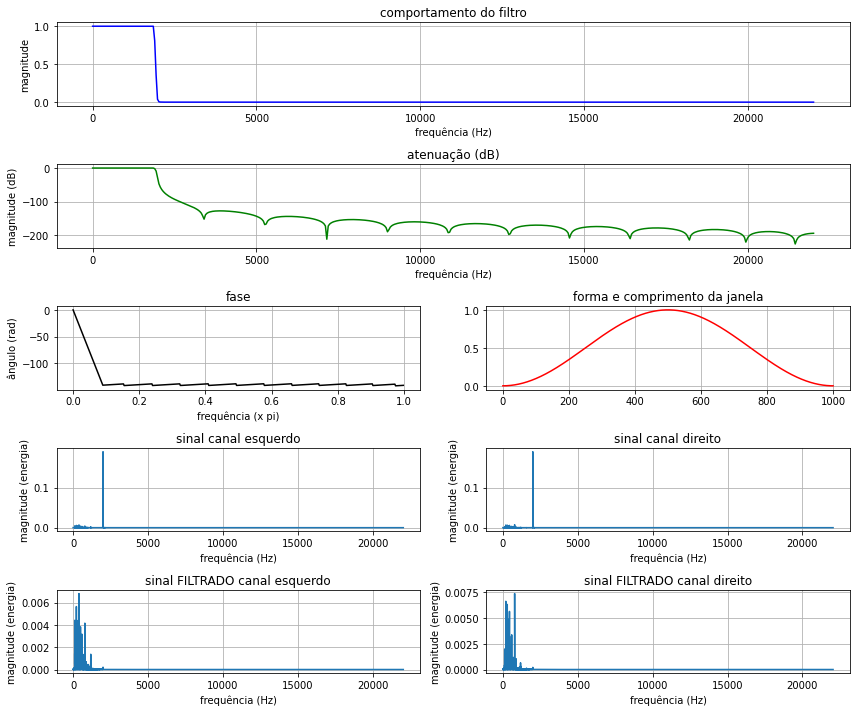

In [ ]:
# definindo parametros
wp1 = to_omega(1e3 + 9e2, freqam)    # freq da banda de passagem 1900 Hz
ws1 = to_omega(1e3 + 9.5e2, freqam)  # freq da banda de corte 1950 Hz  
wc1 = np.mean([wp1, ws1])            # freq de corte

# janela
M = 1e3 + 1       # tamanho da janela
w = np.hanning(M) # vetor janela

# resposta passa baixa ideal
hd = pb_ideal(wc1, M)

# filtro -> produto da resposta ideal do impulso com a janela
h = hd * w

# resposta do filtro em frequencia
mag, db, pha, nw = getFreqResponse(h, w)

# FFT do sinal de audio para utilizar nos plots
ke = get_fft(esq)
kd = get_fft(dir)

# convolucao para realizar a filtragem do sinal
fesq = np.convolve(h, esq, 'same')
fdir = np.convolve(h, dir, 'same')

# FFT do sinal filtrado
fe = get_fft(fesq)
fd = get_fft(fdir)

# graficos
plotFilterInfo(mag, db, pha, nw, w, freqam, ke, kd, fe, fd)

##Escute o áudio filtrado com Passa Baixa e Janela de Hanning

In [ ]:
print('áudio filtrado com o passa baixa')
Audio([fesq, fdir], rate=freqam)
#with open('filtrado_PASSA_BAIXA.wav', 'wb') as f:
    #f.write(x.data)

áudio filtrado com o passa baixa


##Utilizando Janela de Hanning e Passa Faixa p/ Recuperar o ruído



*   O objetivo é passar a faixa de 1950 Hz até 2200 Hz





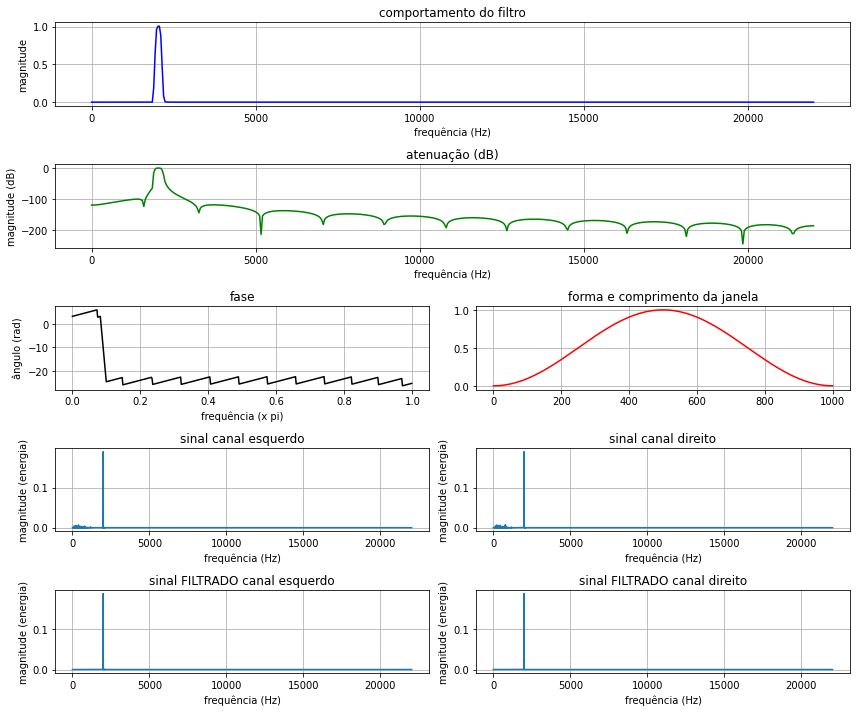

In [ ]:
# definindo parametros
wp1 = to_omega(1e3 + 9e2, freqam)    # freq da banda de passagem 1900 Hz
ws1 = to_omega(1e3 + 9.5e2, freqam)  # freq da banda de corte 1950 Hz  
wc1 = np.mean([wp1, ws1])            # freq de corte

# definindo parametros
wp2 = to_omega(2e3 + 1e2, freqam)    # freq da banda de passagem 2100 Hz
ws2 = to_omega(2e3 + 2e2, freqam)    # freq da banda de corte 2200 Hz  
wc2 = np.mean([wp2, ws2])            # freq de corte

# janela
M = 1e3 + 1       # tamanho da janela
w = np.hanning(M) # vetor janela

# resposta passa faixa ideal
hd = pf_ideal(wc1, wc2, M)

# filtro -> produto da resposta ideal do impulso com a janela
h = hd * w

# resposta do filtro em frequencia
mag, db, pha, nw = getFreqResponse(h, w)

# FFT do sinal de audio para utilizar nos plots
ke = get_fft(esq)
kd = get_fft(dir)

# convolucao para realizar a filtragem do sinal
fesq = np.convolve(h, esq, 'same')
fdir = np.convolve(h, dir, 'same')

# FFT do sinal filtrado
fe = get_fft(fesq)
fd = get_fft(fdir)

# graficos
plotFilterInfo(mag, db, pha, nw, w, freqam, ke, kd, fe, fd)

##Escute o áudio filtrado com Passa Faixa e Janela de Hanning (ruído)

In [ ]:
print('áudio filtrado com o passa faixa')
Audio([fesq, fdir], rate=freqam)
#with open('filtrado_PASSA_FAIXA_RUIDO.wav', 'wb') as f:
 #   f.write(x.data)

áudio filtrado com o passa faixa


##Utilizando Janela de Kaiser e Passa Alta p/ Recuperar o ruído

*   O objetivo é passar a faixa de frequência maiores que 1950 Hz

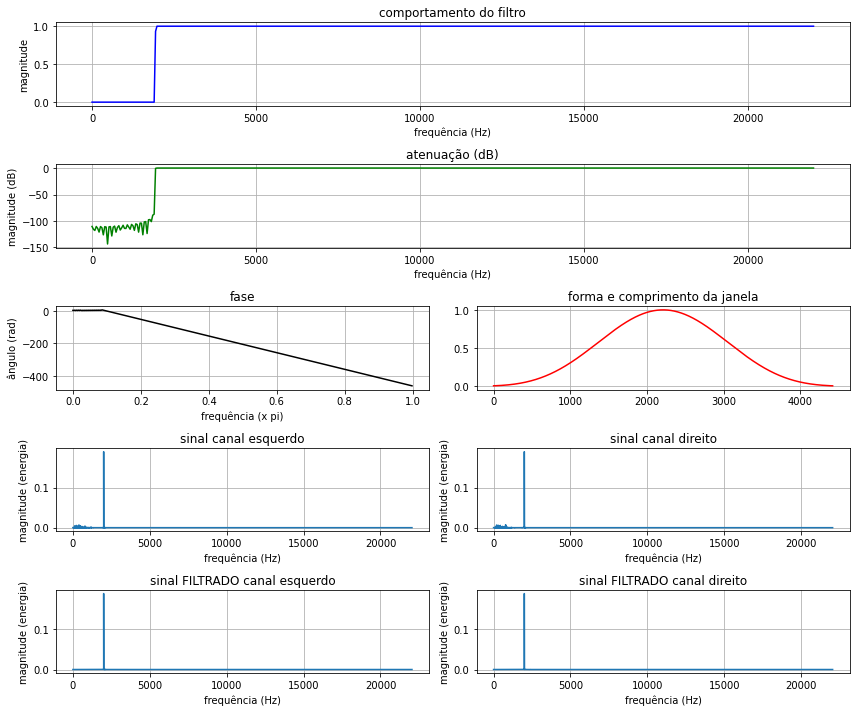

In [ ]:
# definindo parametros
wp1 = to_omega(1e3 + 9e2, freqam)    # freq da banda de passagem 1900 Hz
ws1 = to_omega(1e3 + 9.5e2, freqam)  # freq da banda de corte 1950 Hz  
wc1 = np.mean([wp1, ws1])            # freq de corte
sigma = .0001
deltaW = ws1 - wp1

# janela
M, beta = parametros_kaiser(sigma, deltaW)
w = np.kaiser(M, beta) # vetor janela

# resposta passa alta ideal
hd = pa_ideal(wc1, M)

# filtro -> produto da resposta ideal do impulso com a janela
h = hd * w

# resposta do filtro em frequencia
mag, db, pha, nw = getFreqResponse(h, w)

# FFT do sinal de audio para utilizar nos plots
ke = get_fft(esq)
kd = get_fft(dir)

# convolucao para realizar a filtragem do sinal
fesq = np.convolve(h, esq, 'same')
fdir = np.convolve(h, dir, 'same')

# FFT do sinal filtrado
fe = get_fft(fesq)
fd = get_fft(fdir)

# graficos
plotFilterInfo(mag, db, pha, nw, w, freqam, ke, kd, fe, fd)

##Escute o áudio filtrado com Passa Alta e Janela de Kaiser (ruído)

In [ ]:
print('áudio filtrado com o passa alta e KAISER')
Audio([fesq, fdir], rate=freqam)
#with open('filtrado_PASSA_ALTA_KAISER_RUIDO.wav', 'wb') as f:
    #f.write(x.data)

áudio filtrado com o passa alta e KAISER


##Utilizando Janela de Kaiser e Passa Faixa
*   O objetivo é passar a faixa de 50 Hz até 1950 Hz


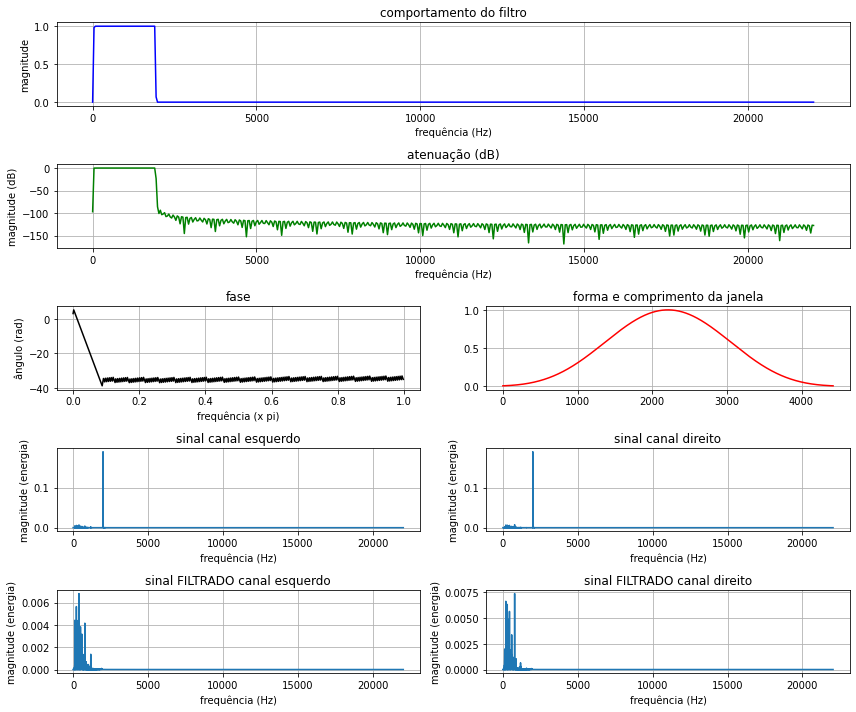

In [ ]:
# definindo parametros
wp1 = to_omega(1, freqam)           # freq da banda de passagem 1 Hz
ws1 = to_omega(50, freqam)          # freq da banda de corte 50 Hz  
wc1 = np.mean([wp1, ws1])           # freq de corte

wp2 = to_omega(1e3 + 9e2, freqam)    # freq da banda de passagem 1900 Hz
ws2 = to_omega(1e3 + 9.5e2, freqam)  # freq da banda de corte 1950 Hz  
wc2 = np.mean([wp2, ws2])            # freq de corte
sigma = .0001
deltaW = ws2 - wp2

# janela
M, beta = parametros_kaiser(sigma, deltaW)
w = np.kaiser(M, beta) # vetor janela

# resposta passa faixa ideal
hd = pf_ideal(wc1, wc2, M)

# filtro -> produto da resposta ideal do impulso com a janela
h = hd * w

# resposta do filtro em frequencia
mag, db, pha, nw = getFreqResponse(h, w)

# FFT do sinal de audio para utilizar nos plots
ke = get_fft(esq)
kd = get_fft(dir)

# convolucao para realizar a filtragem do sinal
fesq = np.convolve(h, esq, 'same')
fdir = np.convolve(h, dir, 'same')

# FFT do sinal filtrado
fe = get_fft(fesq)
fd = get_fft(fdir)

# graficos
plotFilterInfo(mag, db, pha, nw, w, freqam, ke, kd, fe, fd)

##Escute o áudio filtrado com Passa Faixa e Janela de Kaiser



In [ ]:
print('áudio filtrado com o passa faixa e KAISER')
Audio([fesq, fdir], rate=freqam)
#with open('filtrado_PASSA_FAIXA_KAISER.wav', 'wb') as f:
 #   f.write(x.data)

áudio filtrado com o passa faixa e KAISER
